In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline 

import sys
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE

sys.path.append('..')
from env_config import DATA_PATH
from utils import *
from data import *
from plotting import *
from evaluation import *

In [3]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 100

sns.set(style='ticks')
sns.set_palette('cubehelix')

# Read and prepare data

In [ ]:
# Backup
# ctlg_clf = pd.read_csv(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_xgb_f-all__2019-10-08_12:31:16.csv'))
# ctlg_z_qso = pd.read_csv(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_ann_f-all_spec-qso__2019-10-08_13:12:05.csv'))
# ctlg_z_galaxy = pd.read_csv(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_ann_f-all_spec-galaxy__2019-10-08_14:59:04.csv'))

# catalog = merge_specialized_catalogs(ctlg_clf, ctlg_z_qso, ctlg_z_galaxy)
# print(catalog.shape)

In [4]:
kids = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.cols.fits'),
                           columns=['ID', 'MAG_GAAP_r', 'CLASS_STAR'])
print(kids.shape)

(100350873, 3)


In [7]:
kids_x_sdss = process_kids(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.x.SDSS.DR14.fits'), sdss_cleaning=True,
                           columns=COLUMNS_KIDS_ALL+COLUMNS_SDSS)

Data shape: (152244, 49)
Droping NANs: 130777 (85.90%) left
Cleaning SDSS: 122964 left


In [5]:
# Weights
# clf: outputs/inf_models/KiDS_DR4_x_SDSS_DR14_ann_f-all_clf__2020-02-19_13:22:23.hdf5
# z: outputs/inf_models/KiDS_DR4_x_SDSS_DR14_ann_z_f-all_spec-qso__2020-02-19_15:09:11.hdf5

ctlg_clf = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_ann_clf_f-all__2020-02-19_17:01:04.fits'))
ctlg_z_qso = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/catalogs/KiDS_DR4_x_SDSS_DR14_ann_z_f-all_spec-qso__2020-02-20_13:31:58.fits'))

catalog = merge_specialized_catalogs(ctlg_clf, ctlg_z_qso)
print(catalog.shape)

(45383661, 7)


In [8]:
# Add columns from KiDS, e.g. r magnitude for number counts, class star for middle values analysis
catalog = catalog.merge(kids, on='ID')
print(catalog.shape)

(45383663, 9)


In [10]:
qso_kids_sdss = kids_x_sdss.loc[kids_x_sdss['CLASS'] == 'QSO']
qso_kids_photo = catalog.loc[catalog['CLASS_PHOTO'] == 'QSO']
print(qso_kids_sdss.shape)
print(qso_kids_photo.shape)

(13611, 147)
(11505198, 9)


In [11]:
catalog_extended = catalog.loc[catalog['CLASS_STAR'] < 0.25]
catalog_point = catalog.loc[catalog['CLASS_STAR'] > 0.8]

In [12]:
catalog_sampled = catalog.sample(n=500000, random_state=1567)
qso_kids_photo_sampled = qso_kids_photo.sample(n=100000, random_state=1567)

In [13]:
kids_x_gaia = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.x.GAIA.DR2.fits'),
                                  columns=['ID']+COLUMNS_GAIA)
print(kids_x_gaia.shape)

(3885247, 7)


In [14]:
catalog_x_gaia = pd.merge(catalog, kids_x_gaia, on='ID')
print(catalog_x_gaia.shape)

(3066888, 15)


# Data details

In [15]:
print(get_column_desc(catalog['CLASS_PHOTO']))

GALAXY - 27627274 (60.87%)
QSO - 11505198 (25.35%)
STAR - 6251191 (13.77%)


In [16]:
print(catalog_point.shape)
print(get_column_desc(catalog_point['CLASS_PHOTO']))

(5667195, 9)
GALAXY - 84249 (1.49%)
QSO - 1256345 (22.17%)
STAR - 4326601 (76.34%)


In [17]:
print(catalog_extended.shape)
print(get_column_desc(catalog_extended['CLASS_PHOTO']))

(25196049, 9)
GALAXY - 23308736 (92.51%)
QSO - 1468173 (5.83%)
STAR - 419140 (1.66%)


In [18]:
print(get_column_desc(catalog_x_gaia['CLASS_PHOTO']))

GALAXY - 106402 (3.47%)
QSO - 83154 (2.71%)
STAR - 2877332 (93.82%)


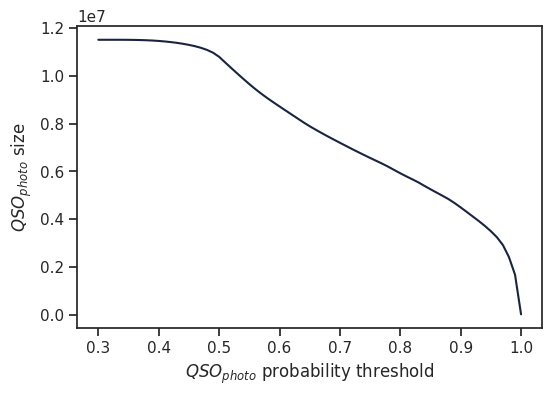

In [19]:
plot_proba_against_size(qso_kids_photo, column='QSO_PHOTO', x_lim=(0.3, 1))

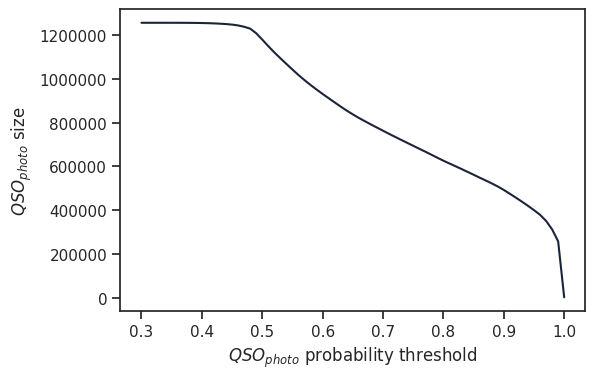

In [21]:
plot_proba_against_size(qso_kids_photo.loc[qso_kids_photo['CLASS_STAR'] > 0.8], column='QSO_PHOTO', x_lim=(0.3, 1))

# External catalogs

In [22]:
test_external_qso(catalog, plot=False, save=False)

catalog size: 45383663
--------------------
KiDS.DR4.x.6QZ.
ext. catalog x KiDS size: 17080
ext. catalog x KiDS catalog size: 16514, train elements: 2386
catalogs cross:
GALAXY - 112 (0.68%)
QSO - 16343 (98.96%)
STAR - 59 (0.36%)
catalogs cross, no train:
GALAXY - 104 (0.74%)
QSO - 13977 (98.93%)
STAR - 47 (0.33%)
--------------------
KiDS.DR4.x.QSO.Richards.2009.
ext. catalog x KiDS size: 33680
ext. catalog x KiDS catalog size: 31537, train elements: 6283
catalogs cross:
GALAXY - 1741 (5.52%)
QSO - 26932 (85.40%)
STAR - 2864 (9.08%)
catalogs cross, no train:
GALAXY - 1699 (6.73%)
QSO - 20849 (82.56%)
STAR - 2706 (10.72%)
--------------------
KiDS.DR4.x.QSO.Richards.2015.
ext. catalog x KiDS size: 38062
ext. catalog x KiDS catalog size: 35511, train elements: 7174
catalogs cross:
GALAXY - 1306 (3.68%)
QSO - 32968 (92.84%)
STAR - 1237 (3.48%)
catalogs cross, no train:
GALAXY - 1269 (4.48%)
QSO - 25895 (91.38%)
STAR - 1173 (4.14%)
--------------------
KiDS.DR4.x.QSO.GALEX.
ext. catalog x

In [23]:
ext_catalog = read_fits_to_pandas(os.path.join(DATA_PATH, 'KiDS/DR4/KiDS.DR4.x.6QZ.fits'))
ext_catalog = process_2df(ext_catalog)
ext_catalog = ext_catalog.loc[ext_catalog['id1'].isin(['GALAXY', 'QSO', 'STAR'])]
catalogs_cross = pd.merge(catalog, ext_catalog, on='ID', suffixes=('', '_right'))

/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'date1' from integer to float
  """Entry point for launching an IPython kernel.
/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'date2' from integer to float
  """Entry point for launching an IPython kernel.
/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'edr_id' from integer to float
  """Entry point for launching an IPython kernel.
/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/ipykernel_launcher.py:1: TableReplaceWarning: converted column 'dr1_id' from integer to float
  """Entry point for launching an IPython kernel.


Multiclass classification results:
Accuracy = 0.9796
F1 per class = [0.     0.9887 0.9377]
Logloss = 0.1157


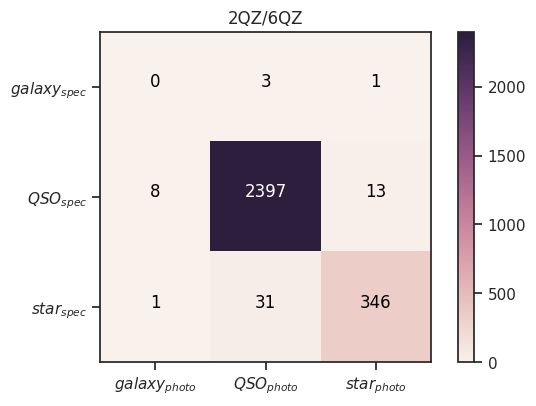

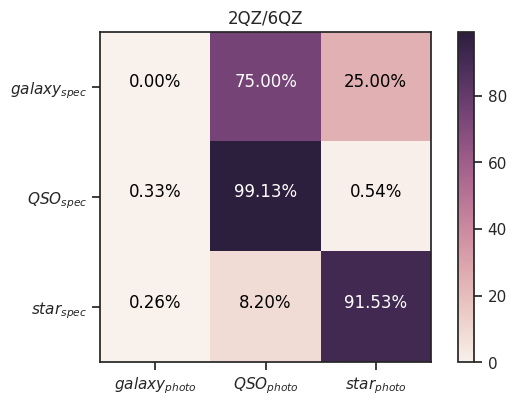

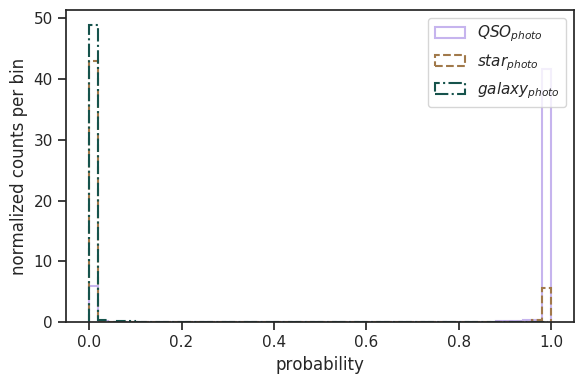

Binary classification results:
Predicted positives: 2431/2800 (86.82%)
Logloss = nan
Accuracy = 0.9804
F1 = 0.9887
Precision = 0.9860
Recall = 0.9913
ROC AUC = 0.9769


/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/sklearn/metrics/classification.py:2174: RuntimeWarning: divide by zero encountered in log
  loss = -(transformed_labels * np.log(y_pred)).sum(axis=1)
/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/sklearn/metrics/classification.py:2174: RuntimeWarning: invalid value encountered in multiply
  loss = -(transformed_labels * np.log(y_pred)).sum(axis=1)


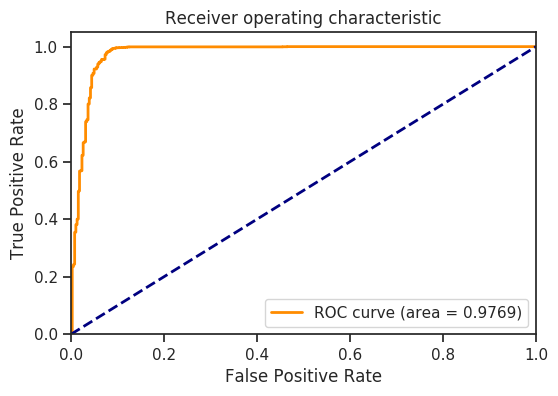

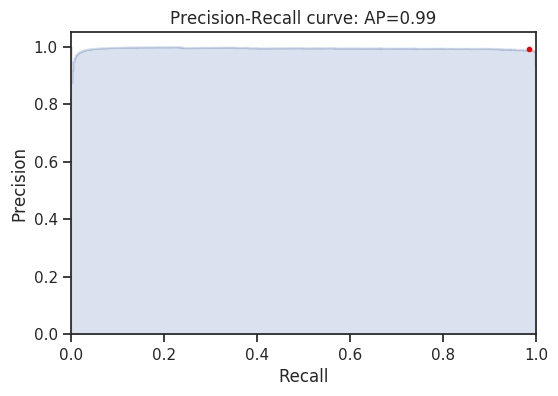

In [24]:
experiment_report(catalogs_cross, col_true='id1')

../plotting.py:340: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


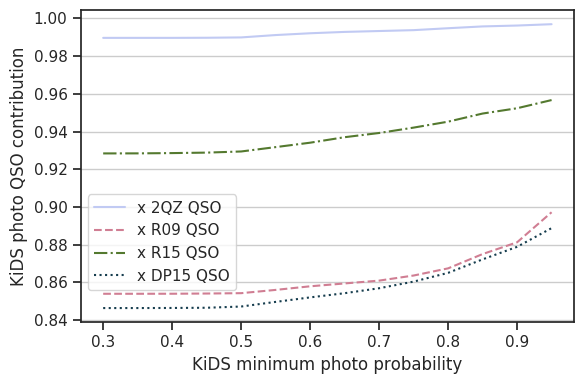

In [25]:
plot_external_qso_consistency(catalog)

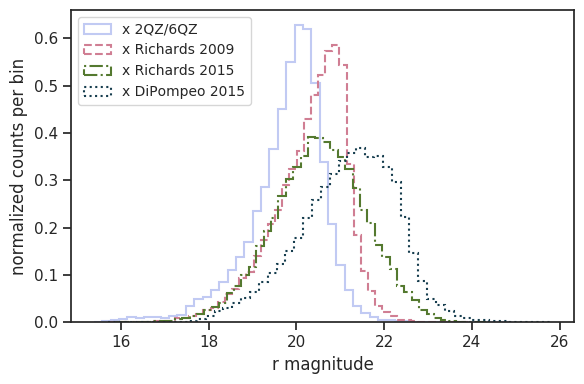

In [26]:
# TODO: take only QSOs from 6QZ and 0.7 min proba QSOs from Galex
data_dict = OrderedDict((data_name, read_fits_to_pandas(data_path, columns=columns).dropna(subset=['MAG_GAAP_r'])) for data_name, data_path, columns in EXTERNAL_QSO)
plot_histograms(data_dict, columns=['MAG_GAAP_r'], pretty_print_function=pretty_print_magnitude, legend_size=10)

# GAIA motion test

In [27]:
print(get_column_desc(catalog_x_gaia['CLASS_PHOTO']))

GALAXY - 106402 (3.47%)
QSO - 83154 (2.71%)
STAR - 2877332 (93.82%)


5 position shape: (2579970, 15)


/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/pandas/core/indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Removing paralax_error shape: (2194287, 18)
Removing pmra_error shape: (1685262, 18)
Removing pmdec_error shape: (1629631, 18)
GALAXY - 855 (0.05%)
QSO - 19917 (1.22%)
STAR - 1608859 (98.73%)
QSO:
          parallax       pmra      pmdec
mean    0.00957044  0.0673995  -0.450026
median -0.00745047 -0.0101927 -0.0110215
sigma     0.712884    7.24641    8.87793
STAR:
        parallax      pmra    pmdec
mean    0.911932 -0.720821 -6.36901
median  0.615395  -1.18787 -4.49525
sigma    1.18538    15.677   12.405
GALAXY:
        parallax      pmra    pmdec
mean    0.286522 -0.186145 -5.20761
median   0.18975 -0.203792 -1.52551
sigma    1.16319   24.9298  21.5428


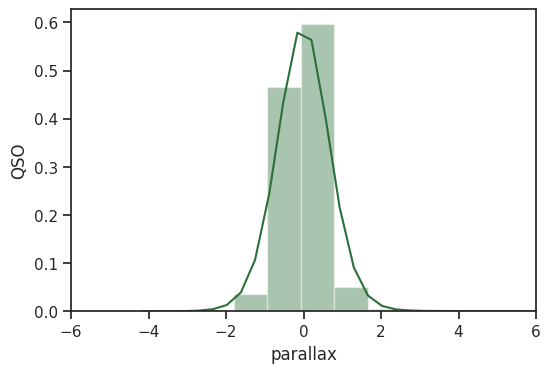

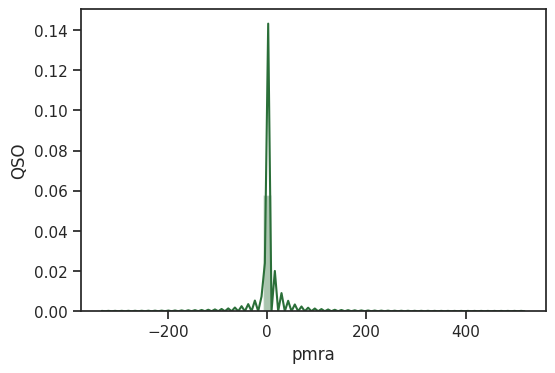

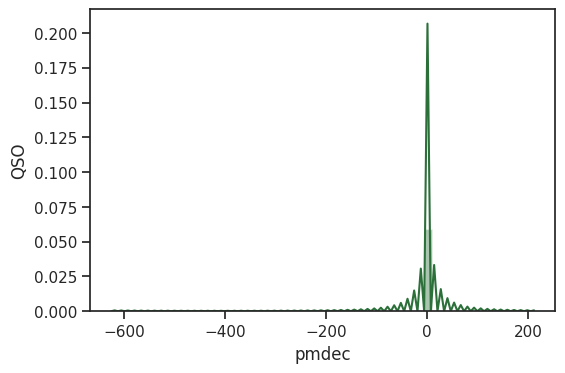

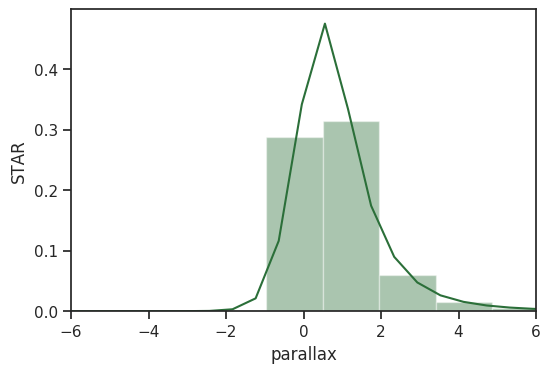

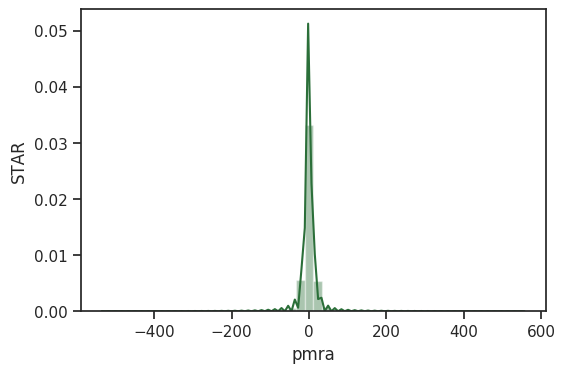

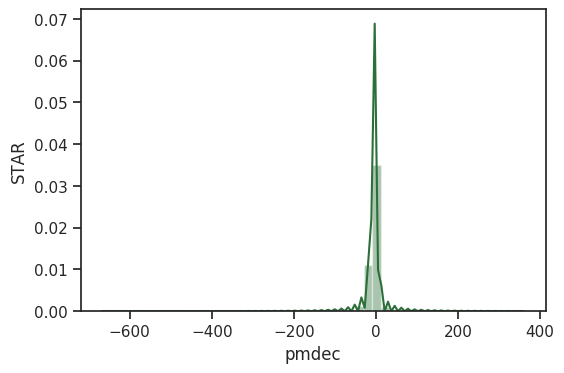

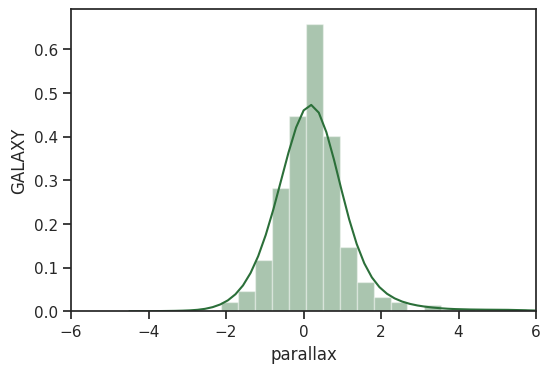

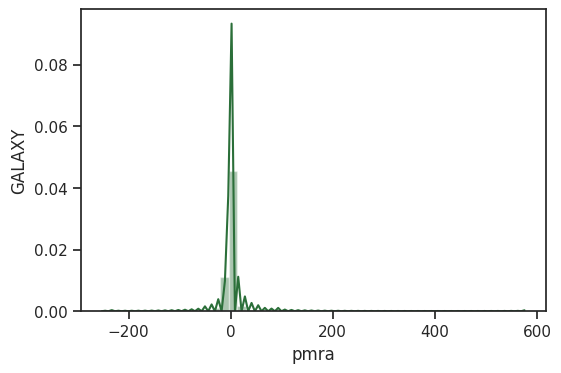

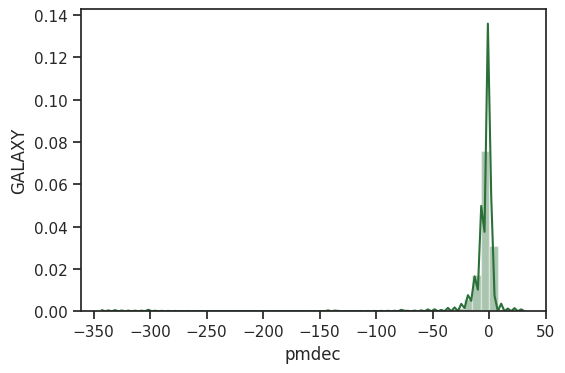

In [28]:
catalog_x_gaia_clean = process_gaia(catalog_x_gaia, parallax_error=1, pm_error=1)
print(get_column_desc(catalog_x_gaia_clean['CLASS_PHOTO']))
gaia_motion_analysis(catalog_x_gaia_clean)

../evaluation.py:660: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


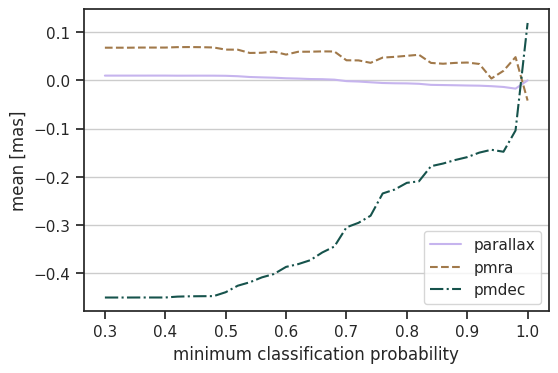

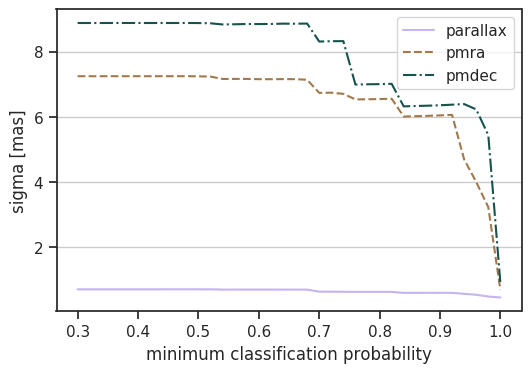

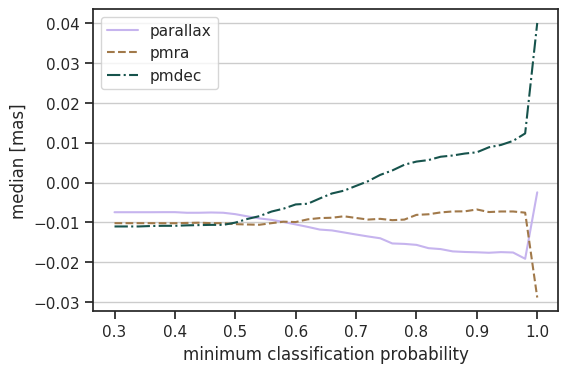

In [29]:
proba_motion_analysis(catalog_x_gaia_clean, motions=['parallax', 'pmra', 'pmdec'])

5 position shape: (2567369, 15)
Removing paralax_error shape: (2186815, 18)
Removing pmra_error shape: (1681076, 18)
Removing pmdec_error shape: (1625797, 18)
GALAXY - 536 (0.03%)
QSO - 18859 (1.16%)
STAR - 1606402 (98.81%)
QSO:
          parallax        pmra       pmdec
mean   -0.00652623   0.0505771   -0.212504
median  -0.0156402 -0.00811528  0.00525711
sigma     0.635345     6.54694     7.00385
STAR:
        parallax      pmra    pmdec
mean    0.912662 -0.722316 -6.36995
median  0.615876  -1.18941 -4.49623
sigma    1.18564   15.6771   12.404
GALAXY:
        parallax       pmra    pmdec
mean     0.14758   0.187532 -3.79104
median  0.132293 -0.0910226  -1.5924
sigma   0.871494    8.67289  8.72082


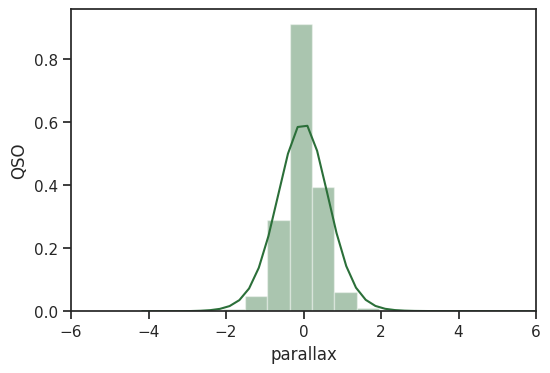

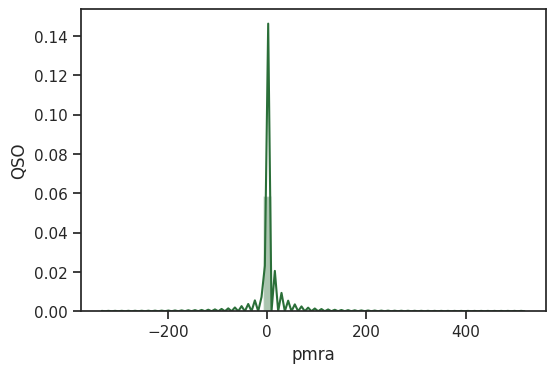

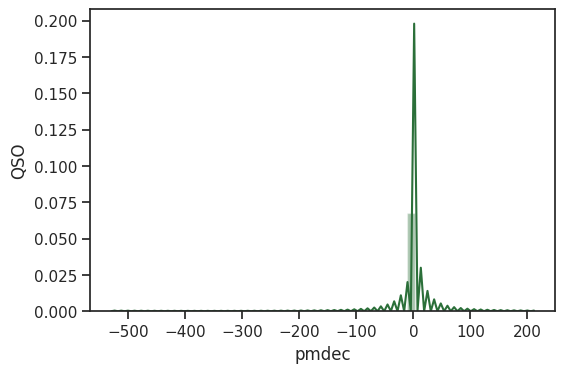

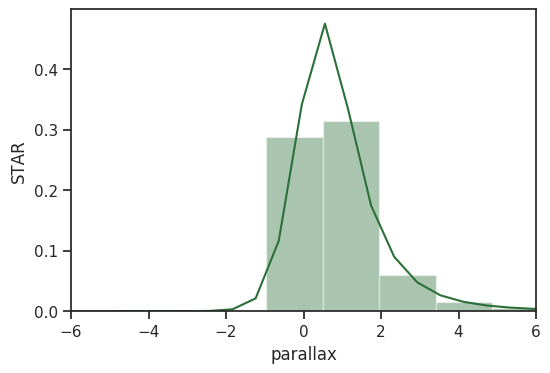

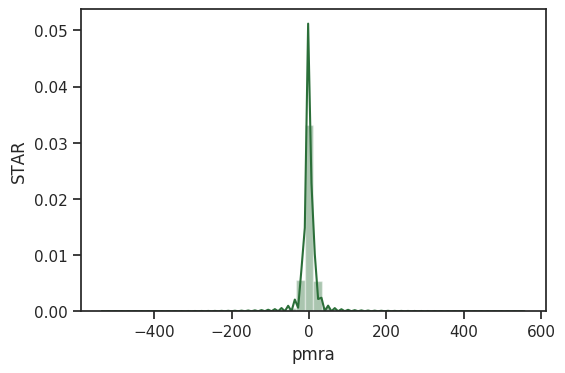

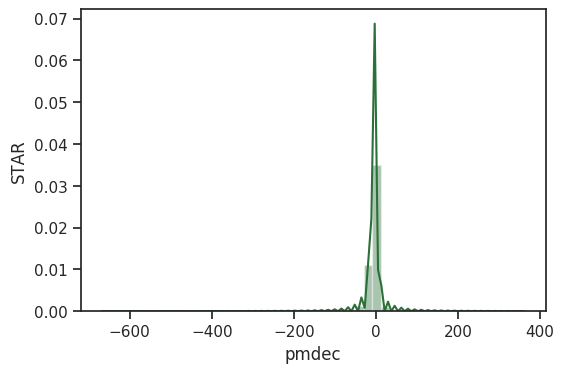

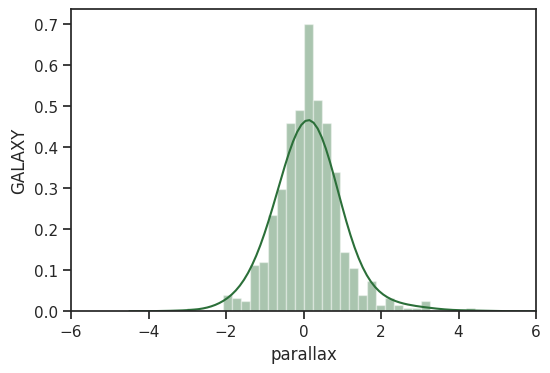

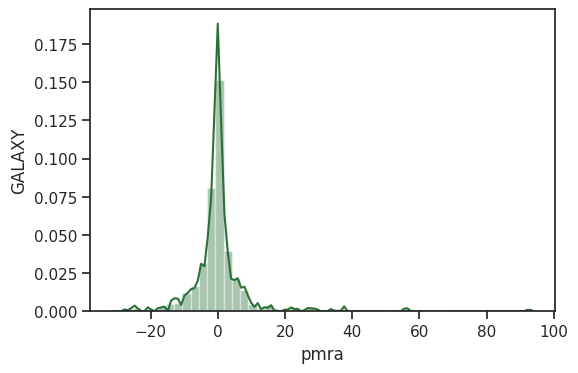

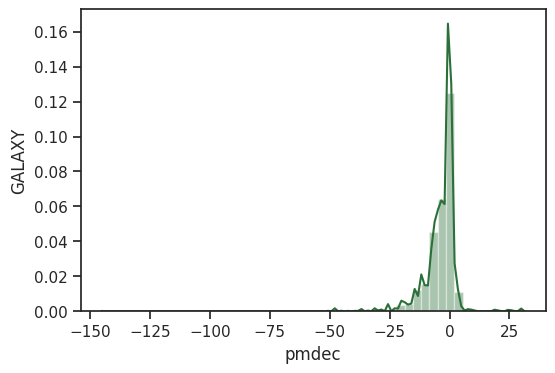

In [30]:
thr = 0.8
tmp = catalog_x_gaia.loc[catalog_x_gaia[['QSO_PHOTO', 'STAR_PHOTO', 'GALAXY_PHOTO']].max(axis=1) > thr]
tmp_clean = process_gaia(tmp, parallax_error=1, pm_error=1)
print(get_column_desc(tmp_clean['CLASS_PHOTO']))
gaia_motion_analysis(tmp_clean)

# Number counts

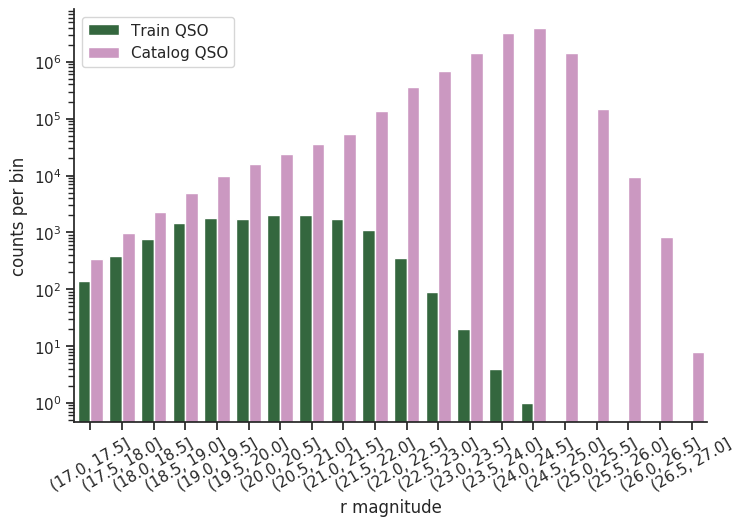

In [31]:
data_dict = {
    'Train QSO': qso_kids_sdss,
    'Catalog QSO': qso_kids_photo,
}
number_counts_multidata(data_dict, x_lim=(17, 27), legend_loc='upper left')

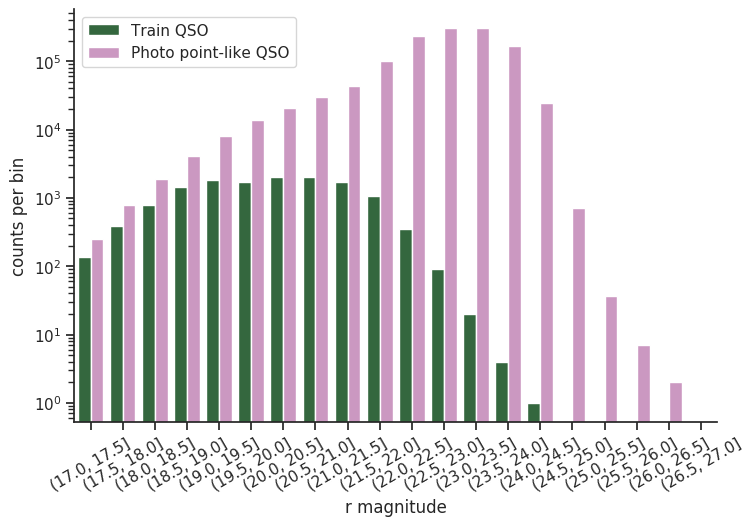

In [32]:
data_dict = {
    'Train QSO': qso_kids_sdss,
    'Photo point-like QSO': catalog_point.loc[catalog['CLASS_PHOTO'] == 'QSO'],
}
number_counts_multidata(data_dict, x_lim=(17, 27), legend_loc='upper left')

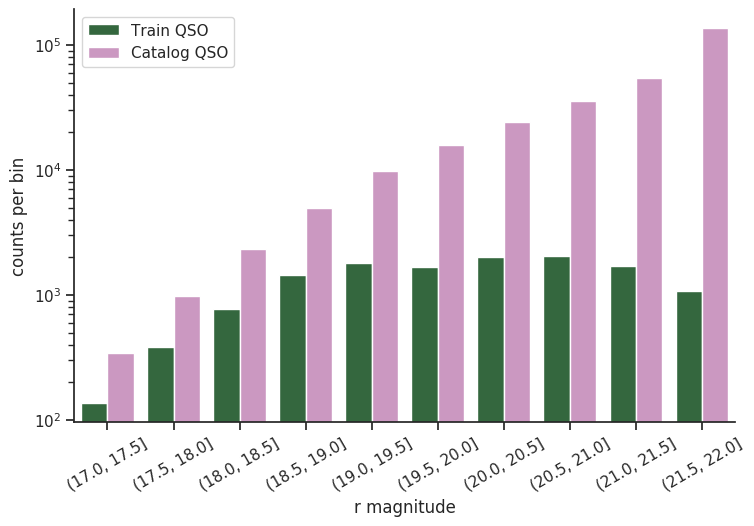

In [33]:
data_dict = {
    'Train QSO': qso_kids_sdss,
    'Catalog QSO': qso_kids_photo,
#     'Catalog QSO, p(QSO) > 0.7': qso_kids_photo.loc[qso_kids_photo['QSO_PHOTO'] > 0.7],
#     'Catalog QSO, p(QSO) > 0.8': qso_kids_photo.loc[qso_kids_photo['QSO_PHOTO'] > 0.8],
}
number_counts_multidata(data_dict, x_lim=(17, 22), legend_loc='upper left')

# t-SNE visualization

In [34]:
kids_sdss_tsne = pd.read_csv('../outputs/t-sne/kids_and_sdss_20k.csv')
kids_sdss_tsne = kids_sdss_tsne.merge(catalog, on='ID', suffixes=('', '_y'))

/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (46) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


/mnt/home/snakoneczny/tools/anaconda3/envs/python3-gpu/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


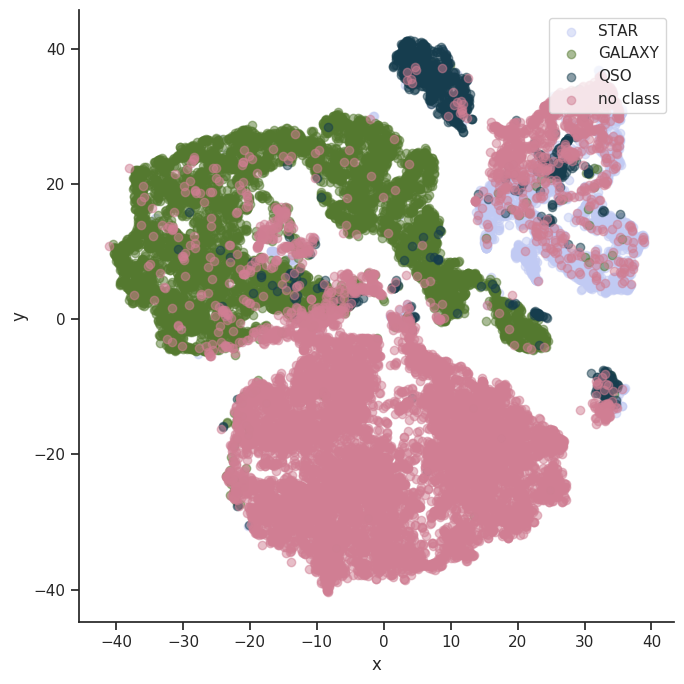

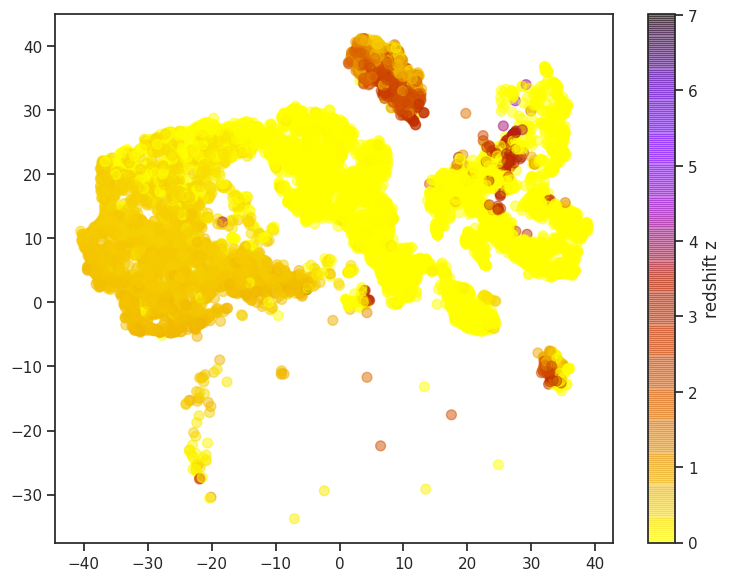

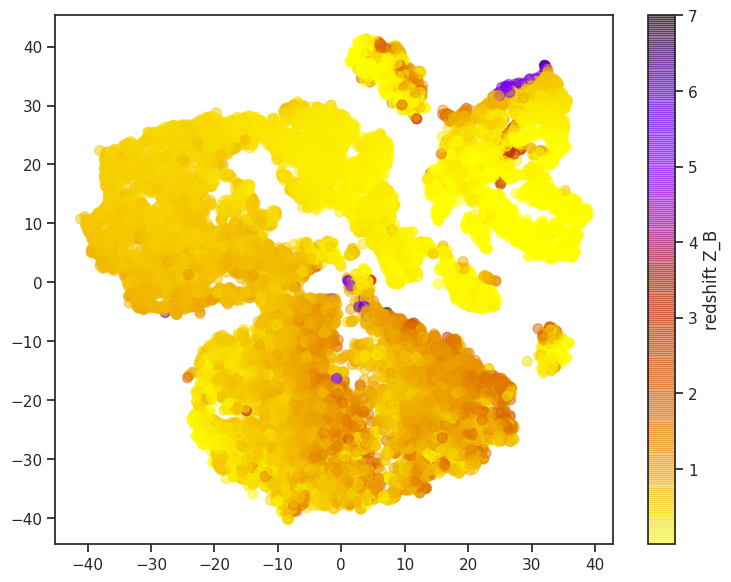

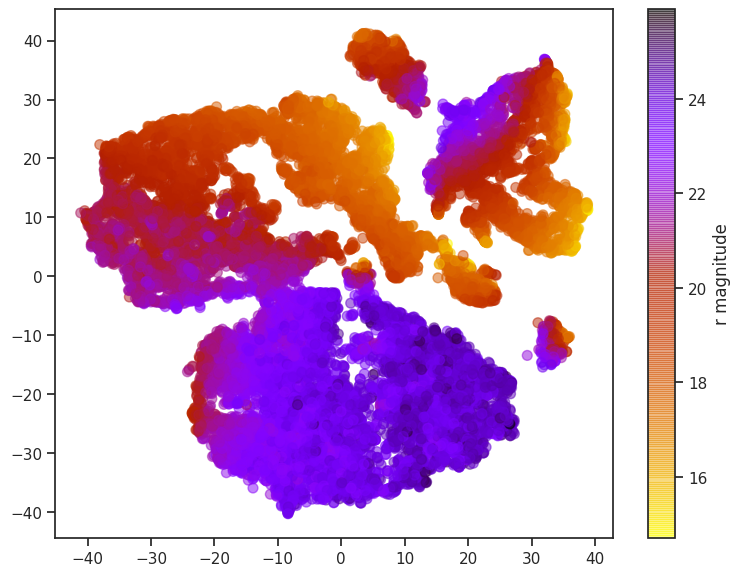

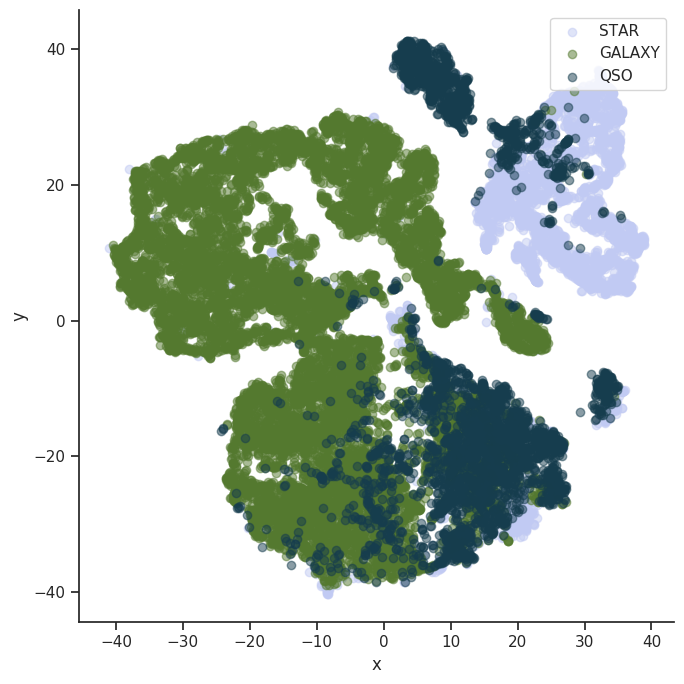

...

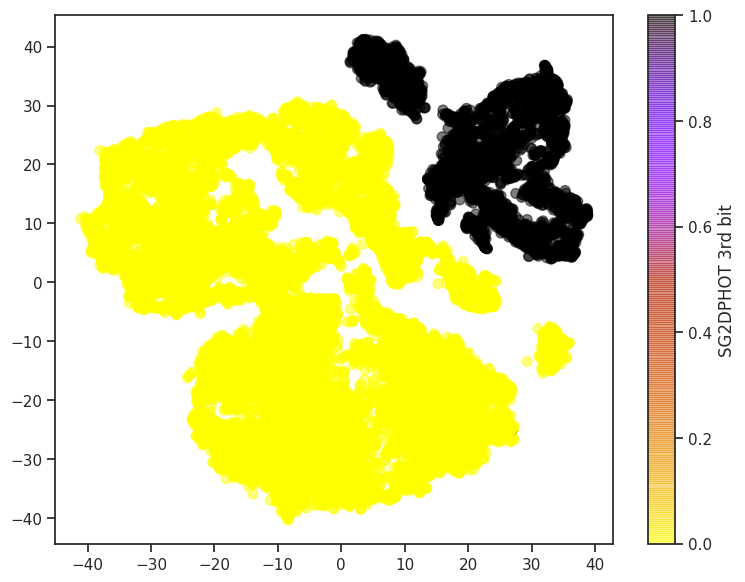

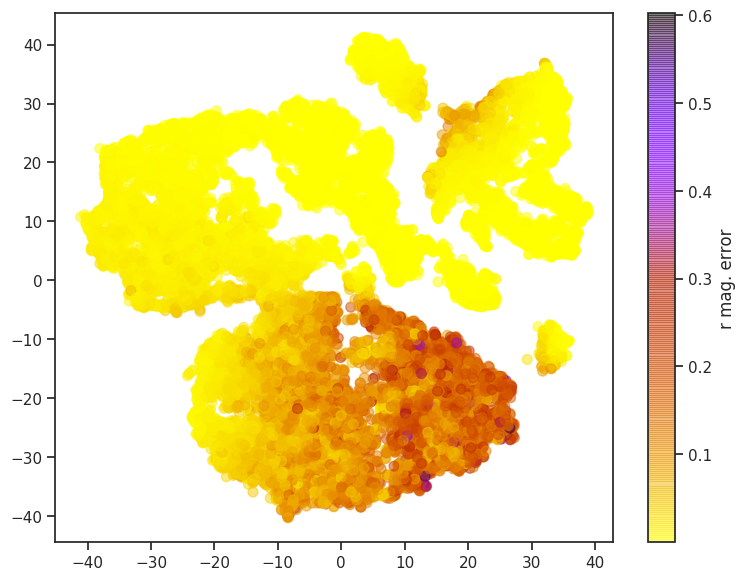

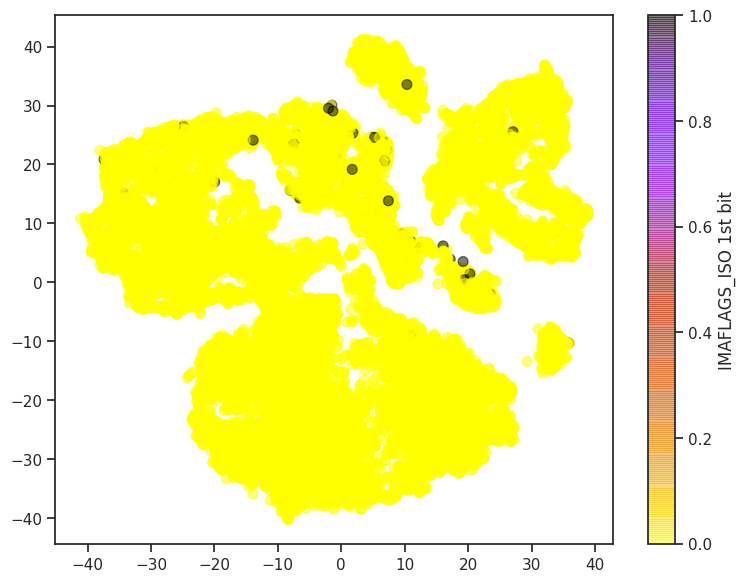

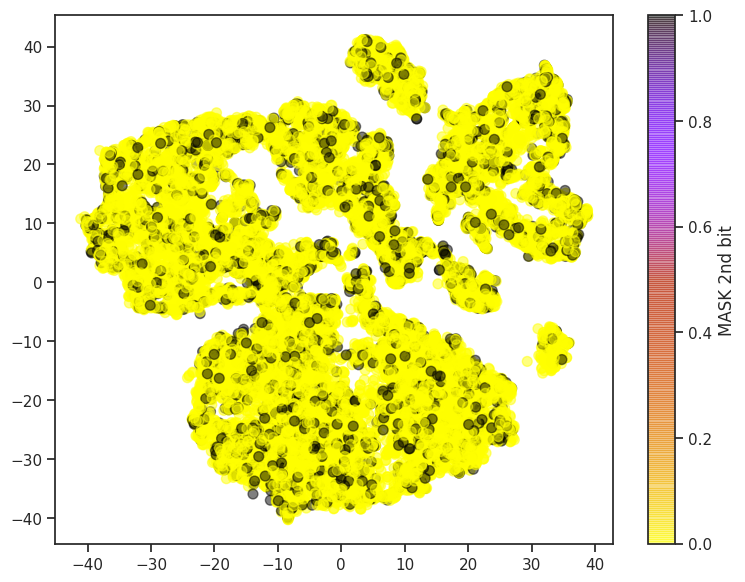

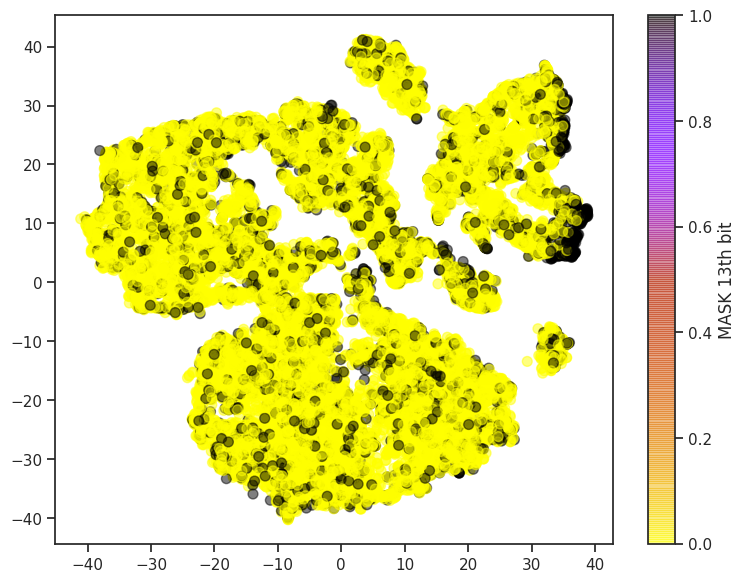

In [35]:
make_embedding_plots(kids_sdss_tsne)

In [36]:
kids_sdss_tsne = pd.read_csv('../outputs/t-sne/kids_and_sdss_no-sg_20k.csv')
kids_sdss_tsne = kids_sdss_tsne.merge(catalog, on='ID', suffixes=('', '_y'))

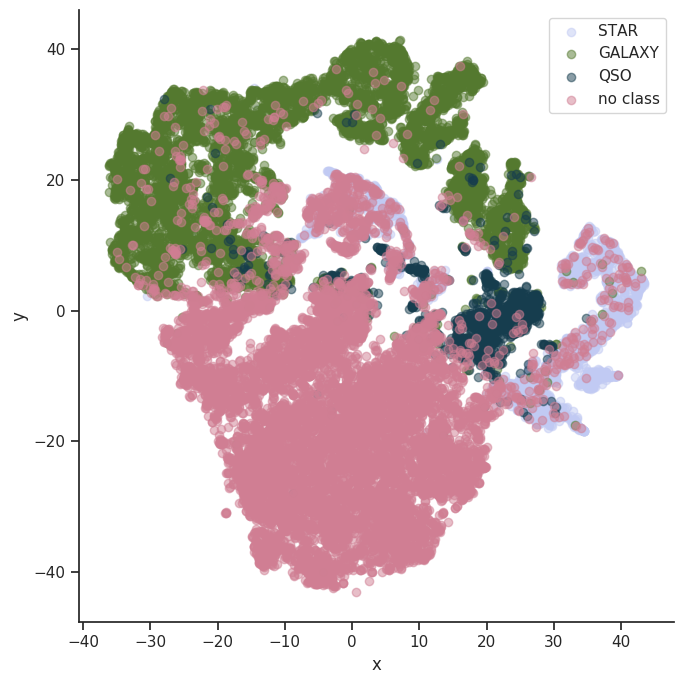

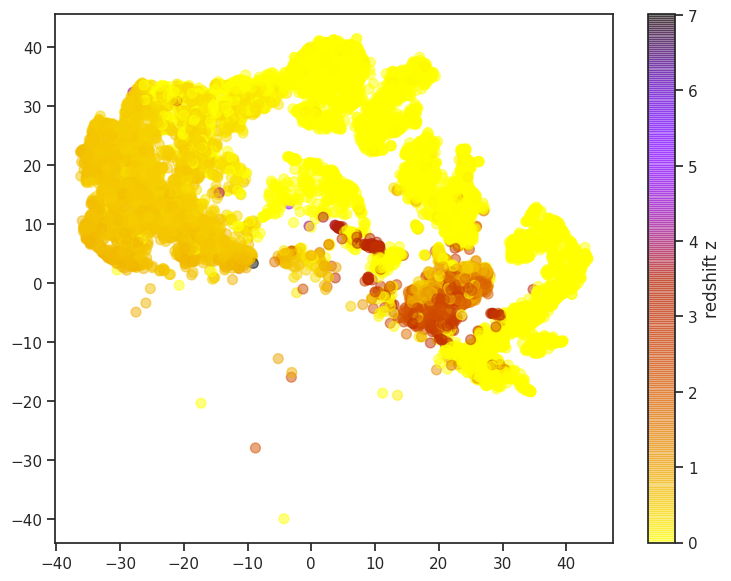

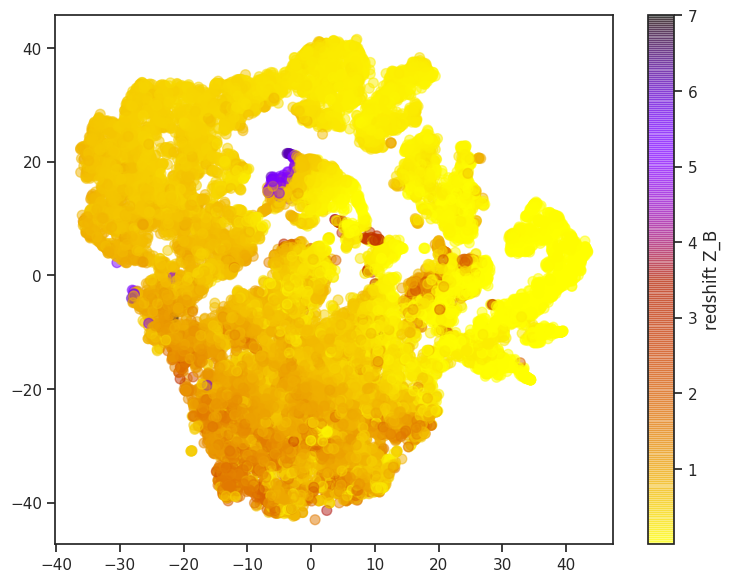

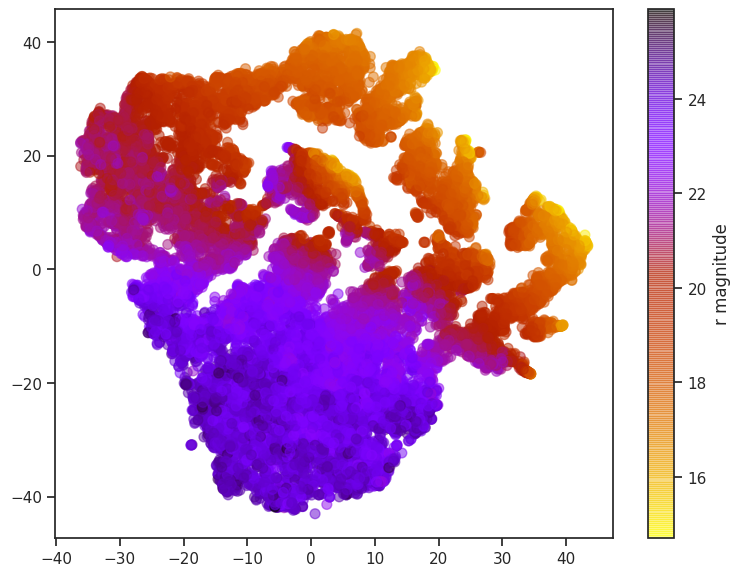

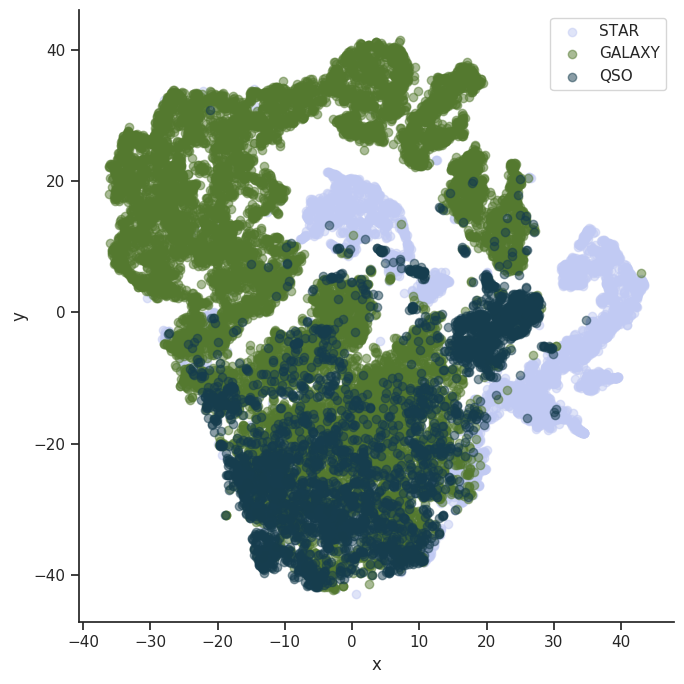

...

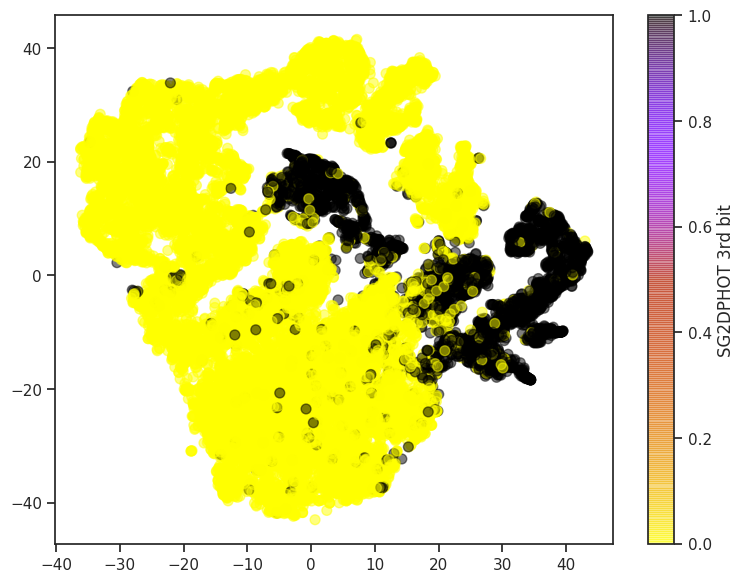

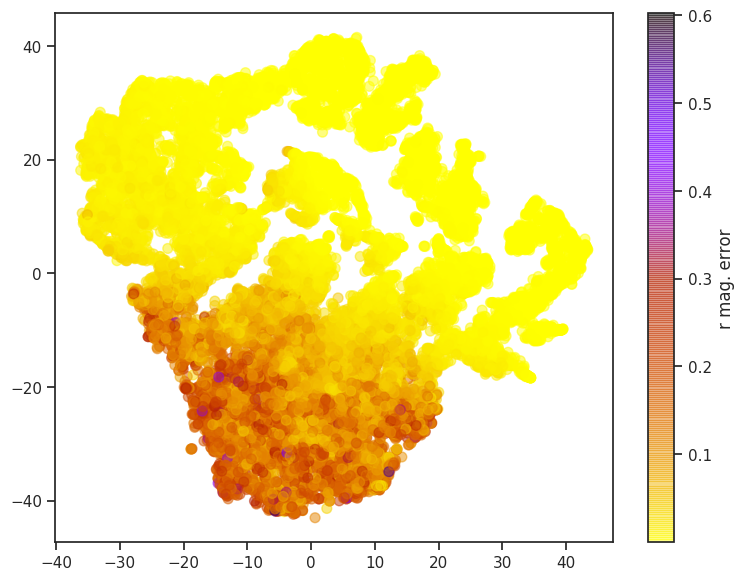

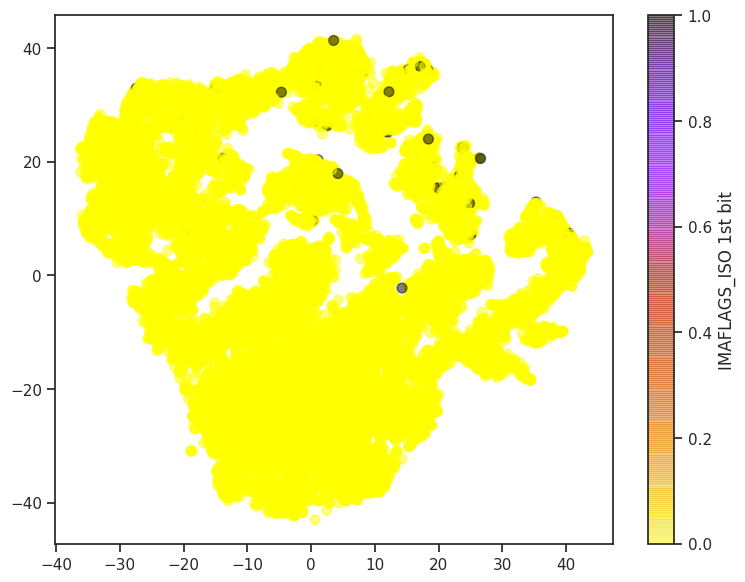

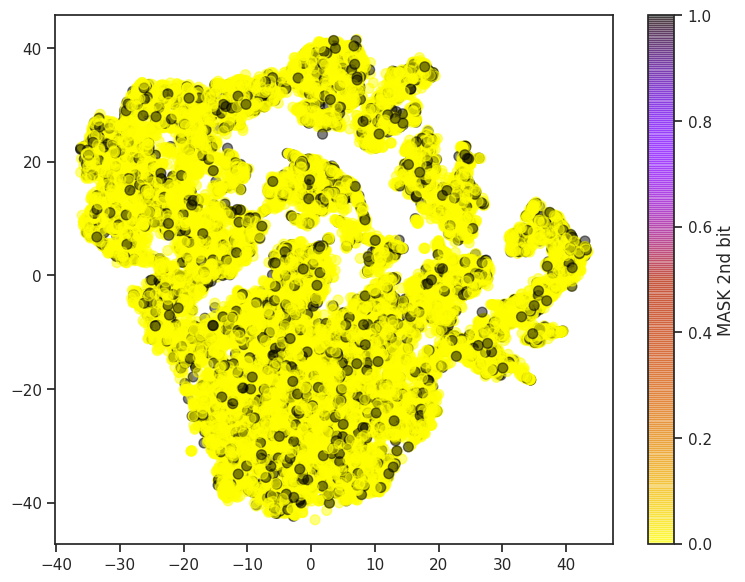

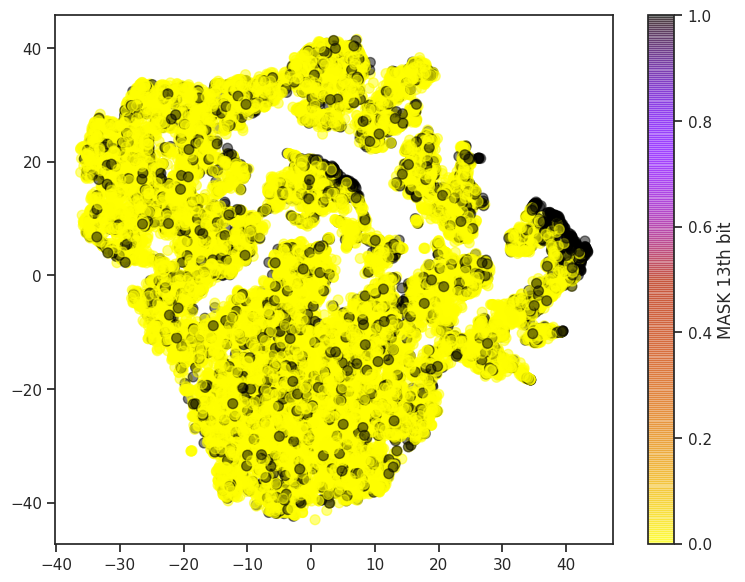

In [37]:
make_embedding_plots(kids_sdss_tsne)

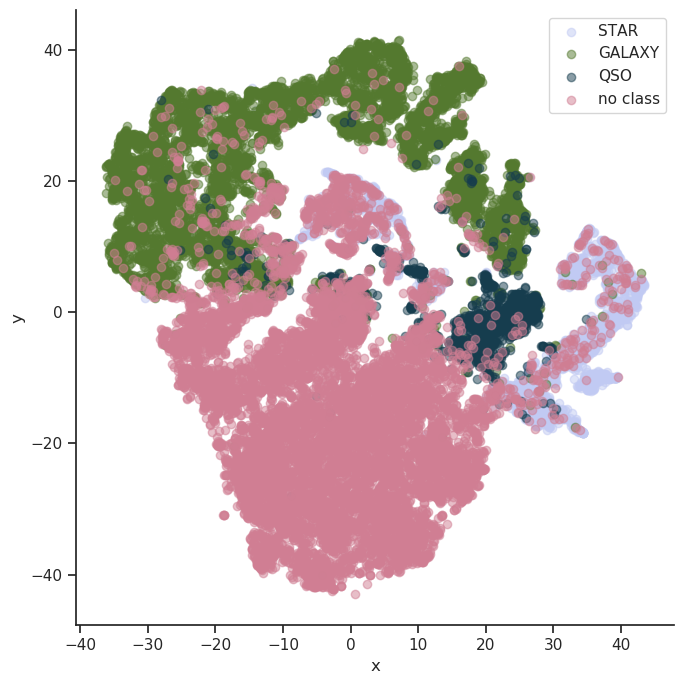

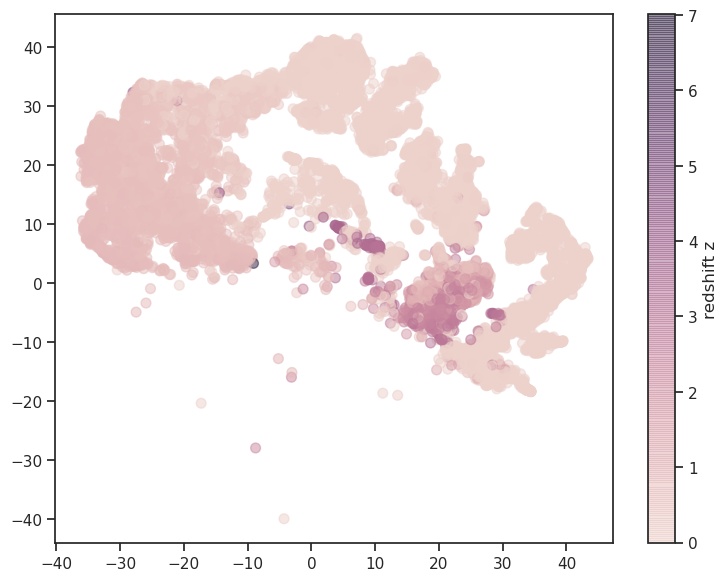

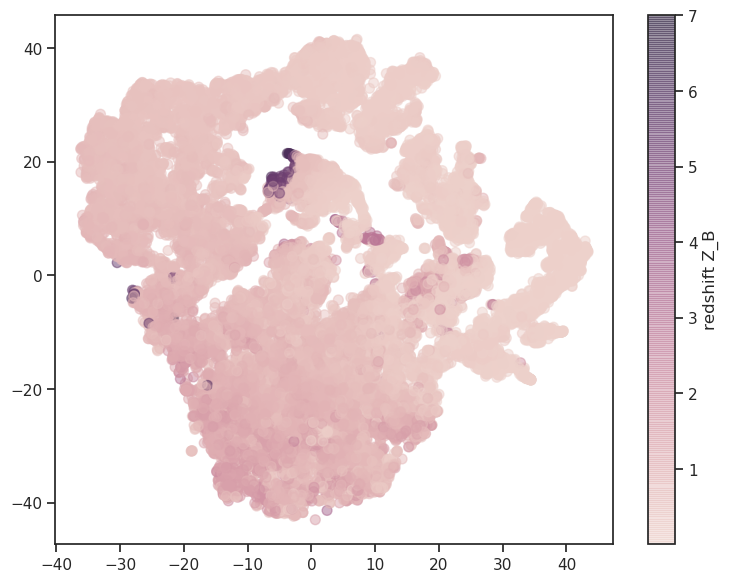

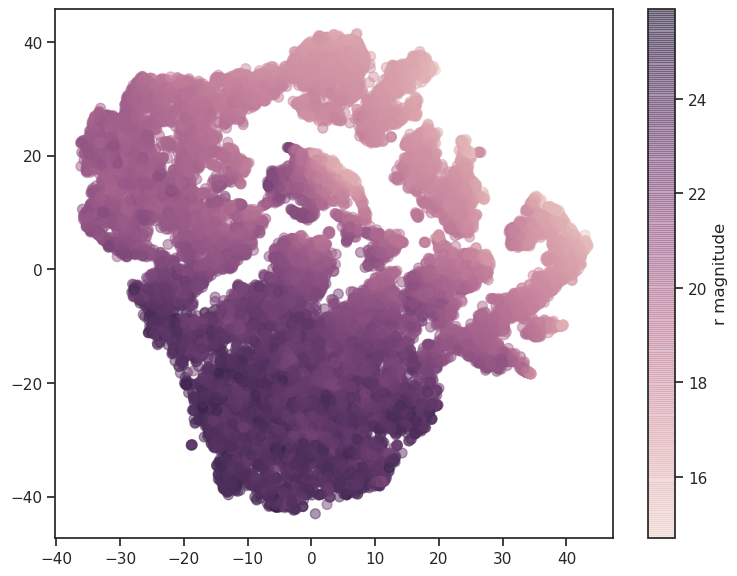

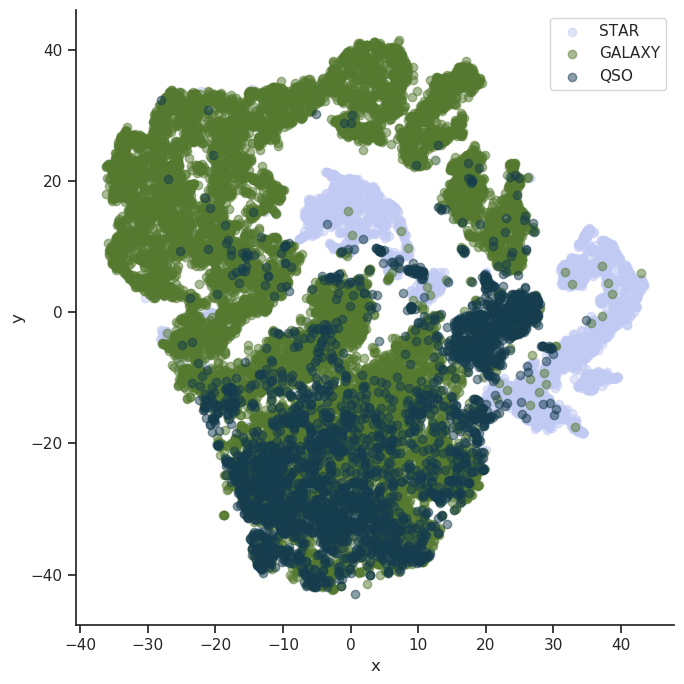

...

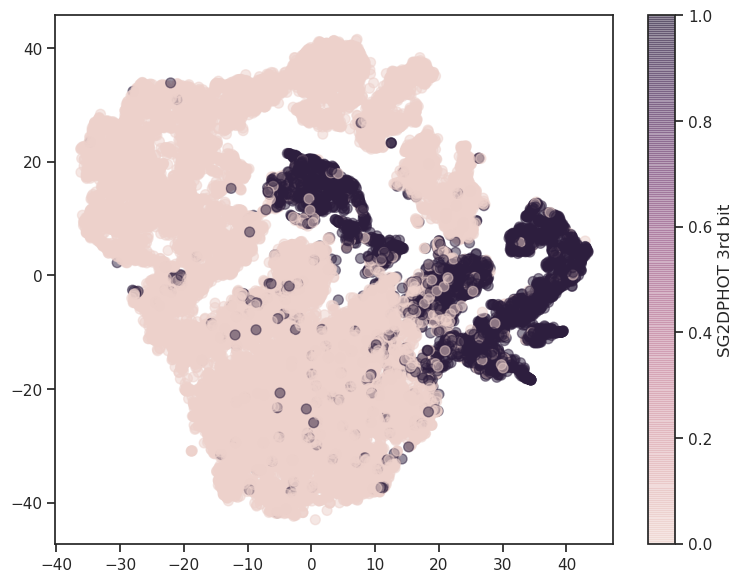

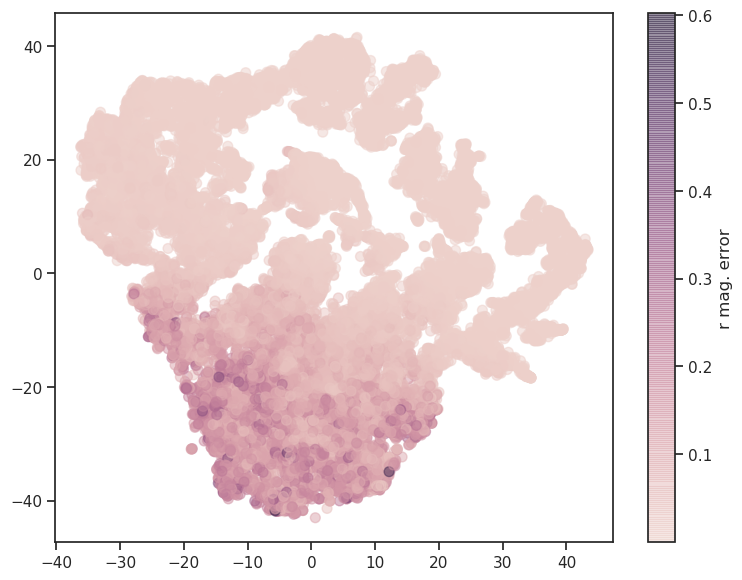

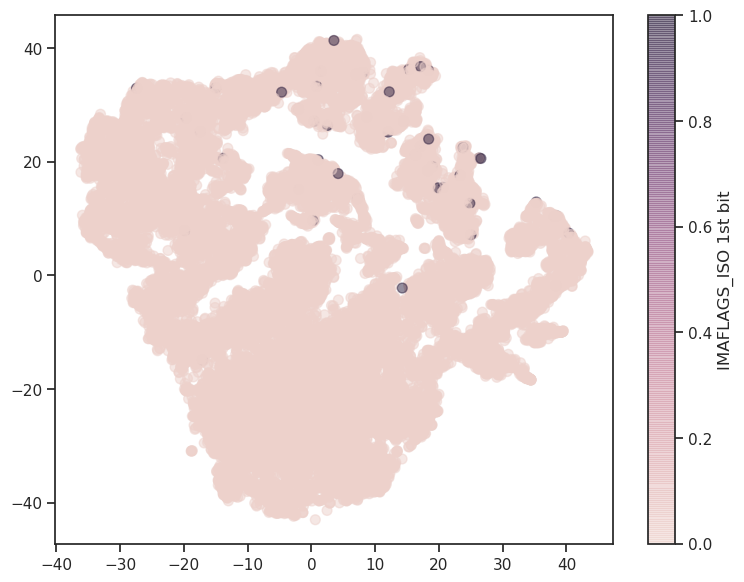

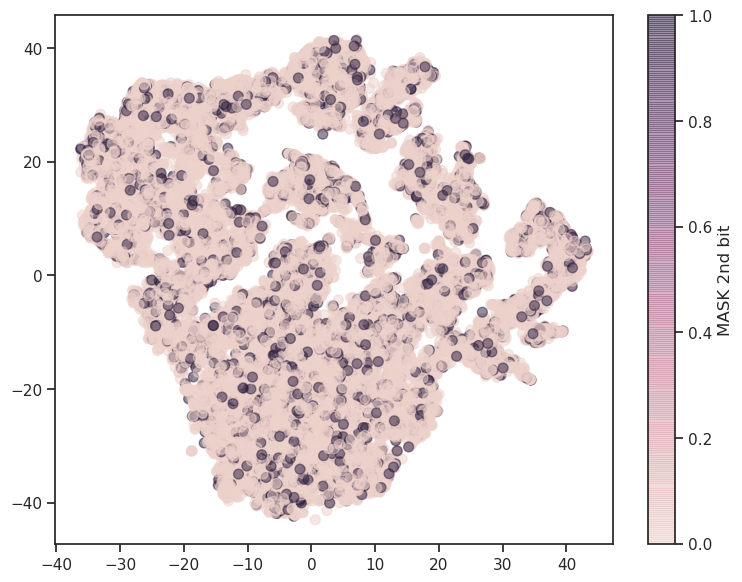

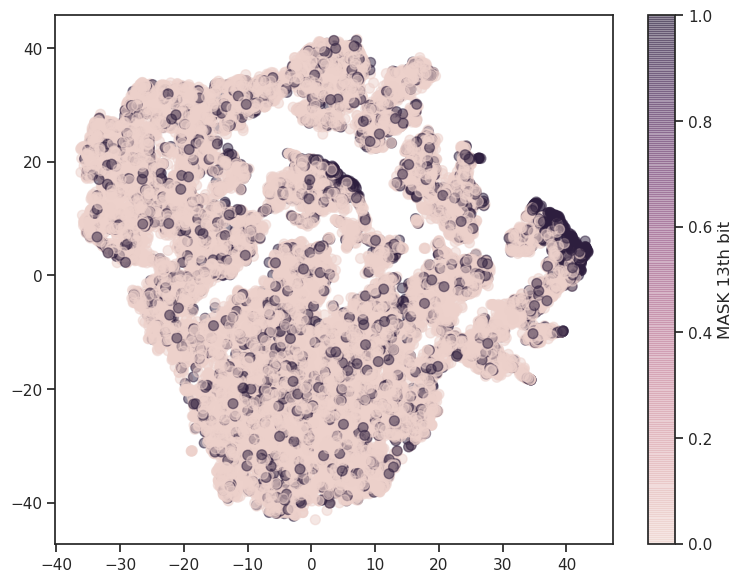

In [21]:
make_embedding_plots(kids_sdss_tsne)

In [38]:
kids_sdss_tsne = pd.read_csv('../outputs/t-sne/kids_and_sdss_colors_20k.csv')
kids_sdss_tsne = kids_sdss_tsne.merge(catalog, on='ID', suffixes=('', '_y'))

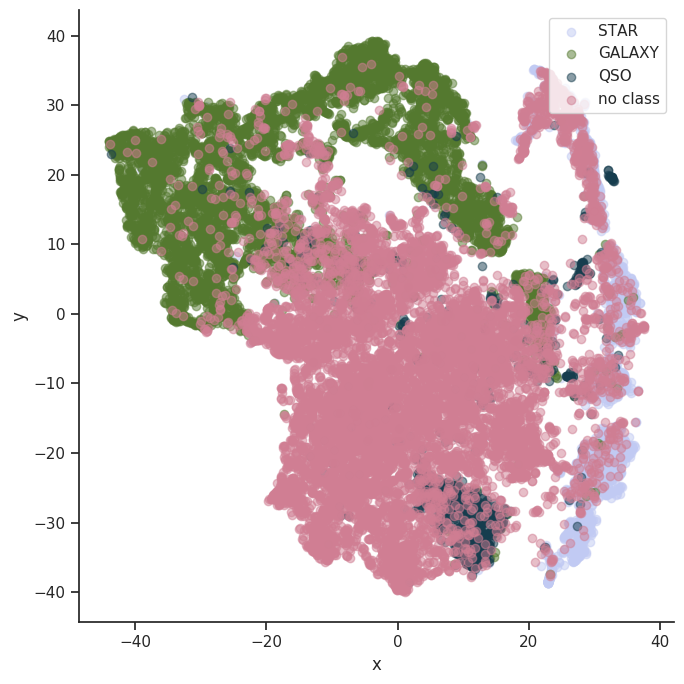

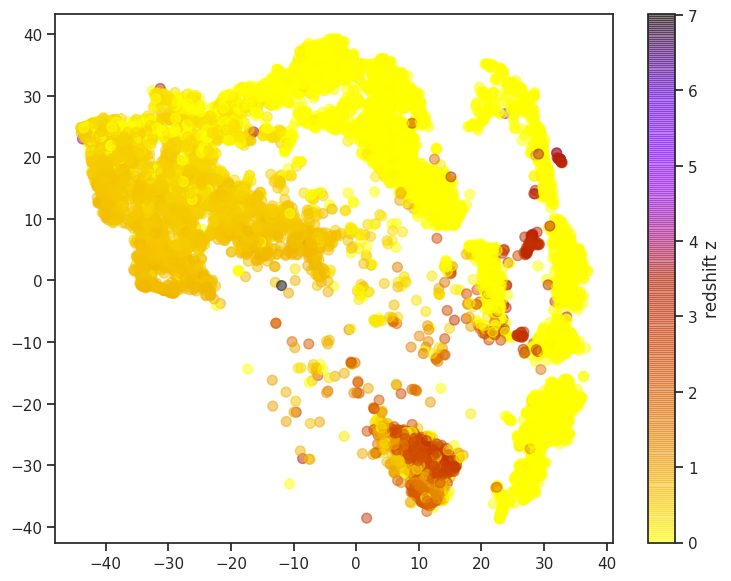

In [ ]:
make_embedding_plots(kids_sdss_tsne)

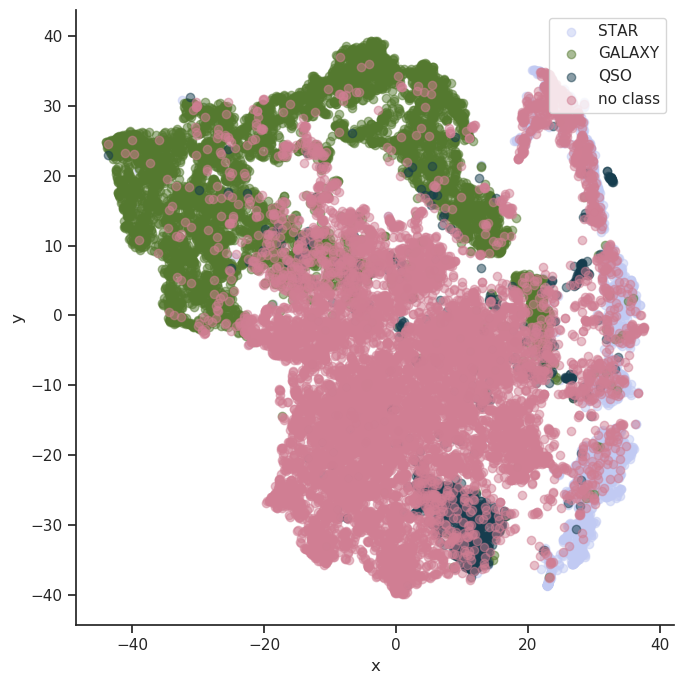

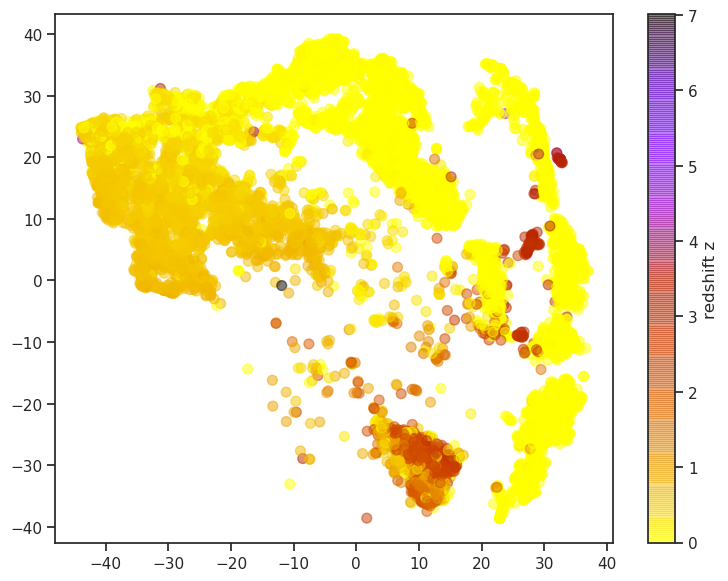

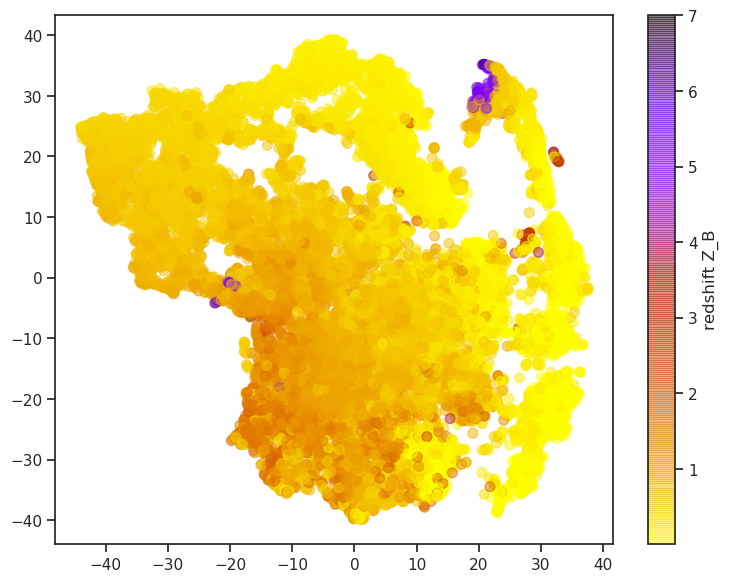

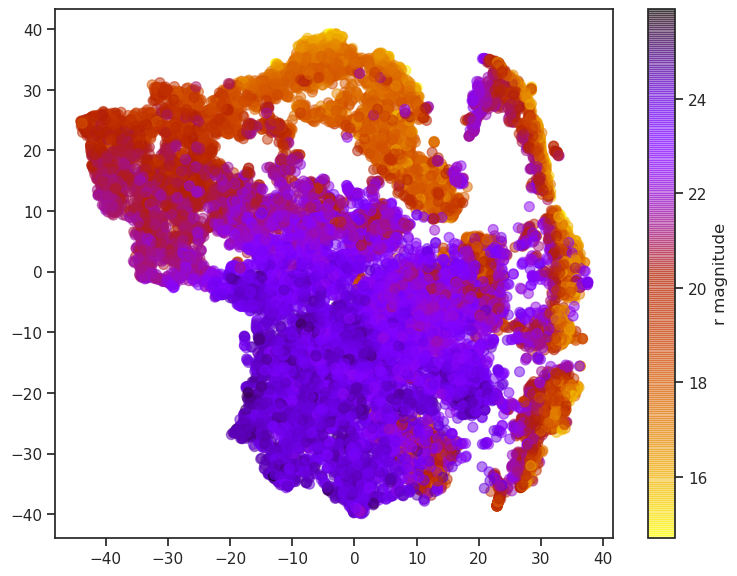

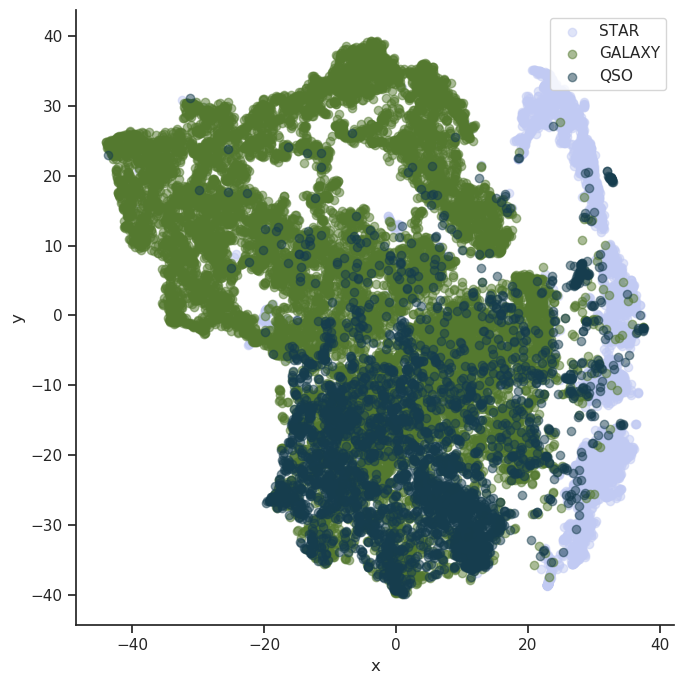

...

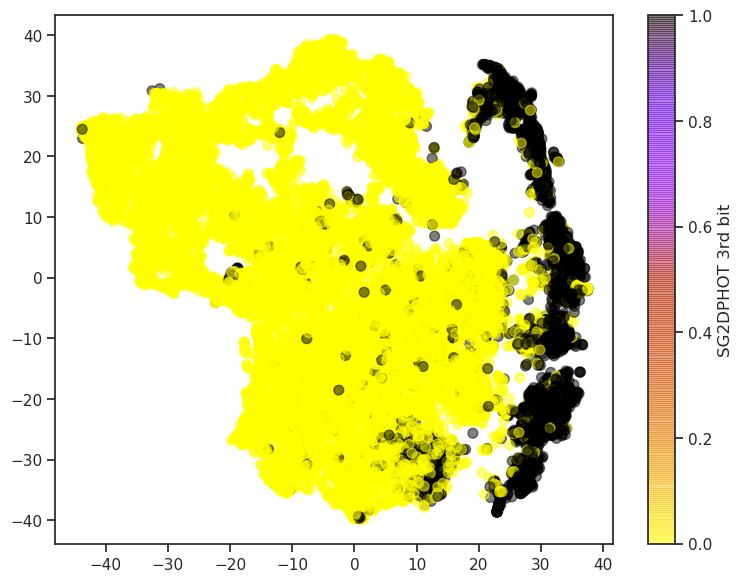

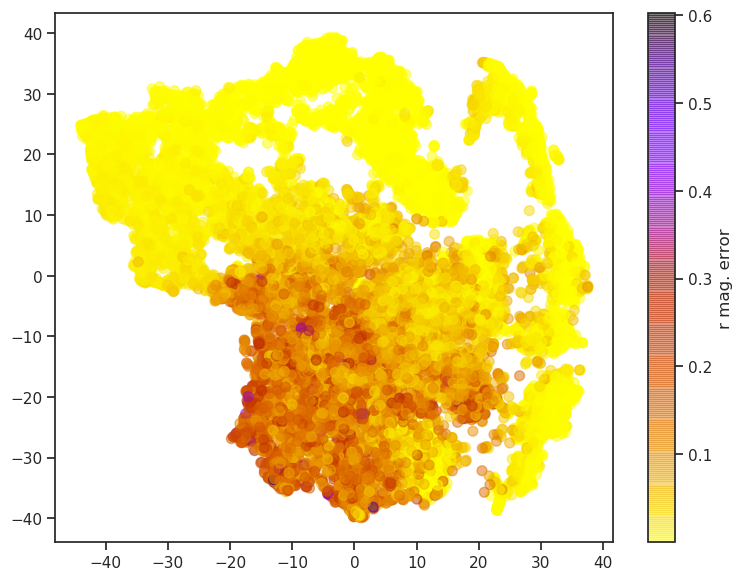

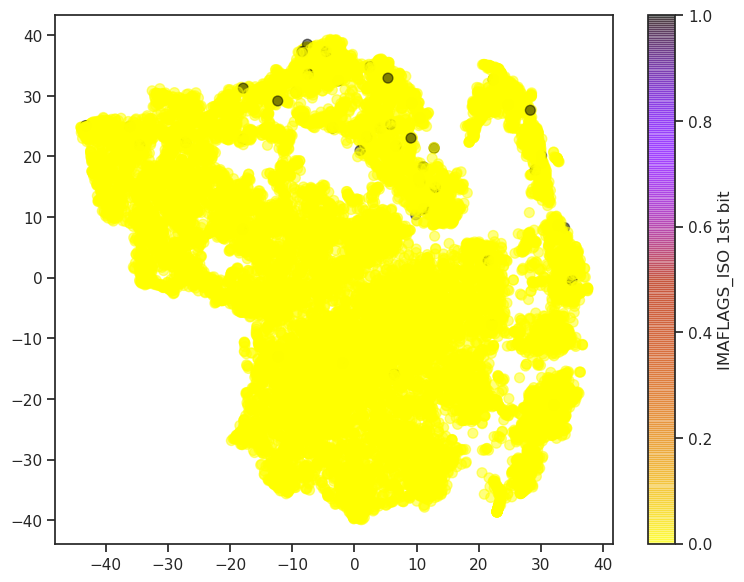

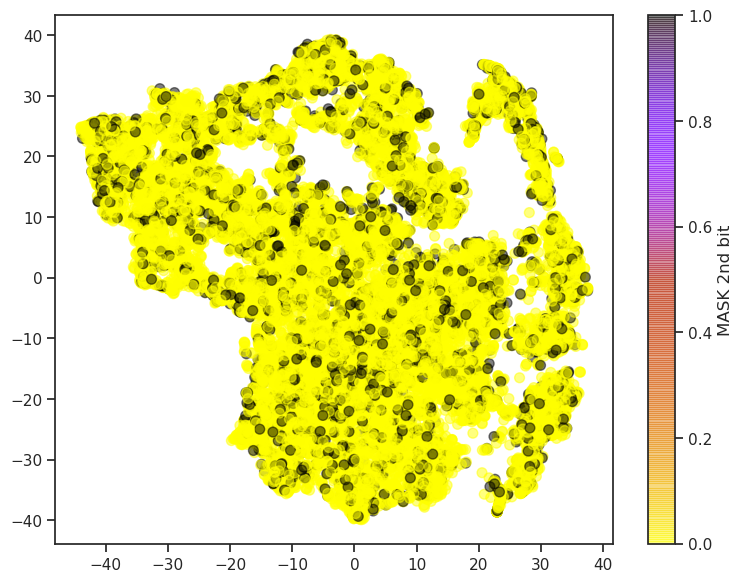

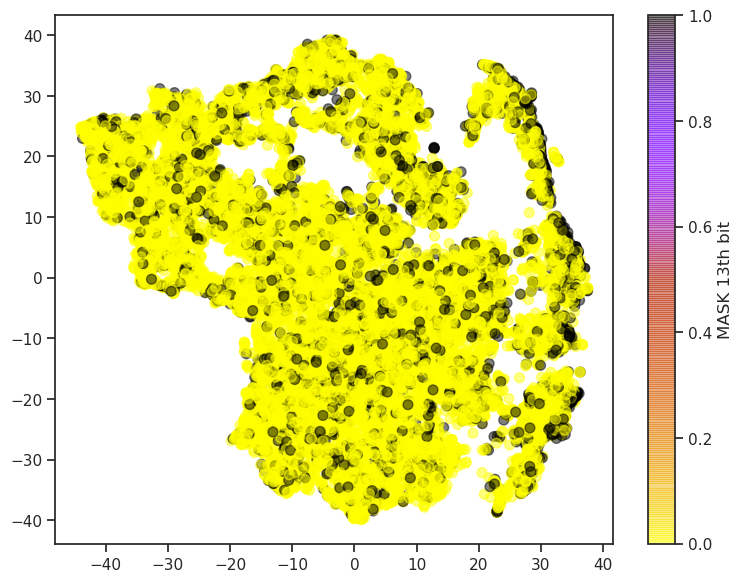

In [48]:
make_embedding_plots(kids_sdss_tsne)